> Combining the best schedules and normalizations so far.

# Introduction

This notebook is Part 6 in a [series](https://enzokro.dev/blog/posts/2022-11-15-guidance-expts-5/) on dynamic Classifier-free Guidance. It combines the best schedules and normalizations we've found so far. 

## Recap of Parts 1-5

The first five parts explored how to turn Classifier-free Guidance into a dynamic process. We found a good set of schedules and normalizations that seem to improve the output of diffusion image models. 

## Part 6: Putting it all together

Part 6 brings together our best approaches so far. Specifically, it explores the following schedules:  

- `kDecay` with large $k$ values.  
- `Inverse kDecay` with small $k$ values.  

On all three Guidance normalizations:  

- `Prediction Normalization`  
- `T-Normalization`  
- `Full Normalization`   

# Python imports

We start with a few python imports.

In [ ]:
import os
import random
from functools import partial
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

## Seed for reproducibility

`seed_everything` makes sure that the results are reproducible across notebooks.

In [ ]:
# set the seed and pseudo random number generator
SEED = 1024
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    generator = torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    return generator

# for sampling the initial, noisy latents
generator = seed_everything(SEED)

# Cosine schedules with k-decay

We create the schedules with different $k$ values using the `cf_guidance` library.

In [ ]:
# helpers to create cosine schedules
from cf_guidance.schedules  import get_cos_sched

# normalizations for classifier-free guidance
from cf_guidance.transforms import GuidanceTfm, BaseNormGuidance, TNormGuidance, FullNormGuidance

For the other schedule parameters, we keep the [same values](https://enzokro.dev/blog/posts/2022-11-20-guidance-expts-2/#default-schedule-parameters) from the rest of the series. The functions below are also shared with previous notebooks. 

In [ ]:
# Default schedule parameters from the blog post
######################################
max_val           = 7.5   # guidance scaling value
min_val           = 1.    # minimum guidance scaling
num_steps         = 50    # number of diffusion steps
num_warmup_steps  = 0     # number of warmup steps
warmup_init_val   = 0     # the intial warmup value
num_cycles        = 0.5   # number of cosine cycles
k_decay           = 1     # k-decay for cosine curve scaling 

# smaller values for T-Norm and FullNorm
max_T = 0.2
min_T = 0.01
######################################

DEFAULT_COS_PARAMS = {
    'max_val':           max_val,
    'num_steps':         num_steps,
    'min_val':           min_val,
    'num_cycles':        num_cycles,
    'k_decay':           k_decay,
    'num_warmup_steps':  num_warmup_steps,
    'warmup_init_val':   warmup_init_val,
}

DEFAULT_T_PARAMS = {
    'max_val':           max_T,
    'num_steps':         num_steps,
    'min_val':           min_T,
    'num_cycles':        num_cycles,
    'k_decay':           k_decay,
    'num_warmup_steps':  num_warmup_steps,
    'warmup_init_val':   warmup_init_val,
}

def cos_harness(default_params, new_params):
    '''Creates cosine schedules with updated parameters in `new_params`
    '''
    # start from the given baseline `default_params`
    cos_params = dict(default_params)
    # update the with the new, given parameters
    cos_params.update(new_params)
    
    # return the new cosine schedule
    sched = get_cos_sched(**cos_params)
    return sched


def create_expts(params: dict, schedule_func) -> list:
    '''Creates a list of experiments.
    
    Each element is a dictionary with the name, value, and schedule for a given parameter.
    A `title` field is also added for easy plotting.
    '''
    names = sorted(params)
    expts = []
    # step through parameter names and their values
    for i,name in enumerate(names):
        for j,val in enumerate(params[name]):
            # create the experiment
            expt = {'param_name': name,
                    'val': val,
                    'schedule': schedule_func(new_params={name:val})}
            # name for plotting
            expt['title'] = f'Param: "{name}", val={val}'
            # add it to the experiment list
            expts.append(expt)
    return expts

Next we create the best k-decay cosine schedules.

In [ ]:
# create the k-decay cosine experiments
k_params = {'k_decay': [1, 2, 5]}
k_func = partial(cos_harness, default_params=DEFAULT_COS_PARAMS)
k_expts = create_expts(k_params, k_func)

# setup for the Inverse-k-decay cosine schedules
inv_k_params = {'k_decay': [0.15, 0.2, 0.3, 0.5, 0.7]}
inv_k_func = partial(cos_harness, default_params=DEFAULT_COS_PARAMS)
inv_k_expts = create_expts(inv_k_params, inv_k_func)

# invert the `k` schedules with small values
tmp = []
for s in inv_k_expts:
    new_vals = dict(s)
    inv = [max_val - g + min_val for g in s['schedule']]
    new_vals['schedule'] = inv
    tmp.append(new_vals)
inv_k_expts = tmp

# put all schedules together
all_k_expts = k_expts + inv_k_expts

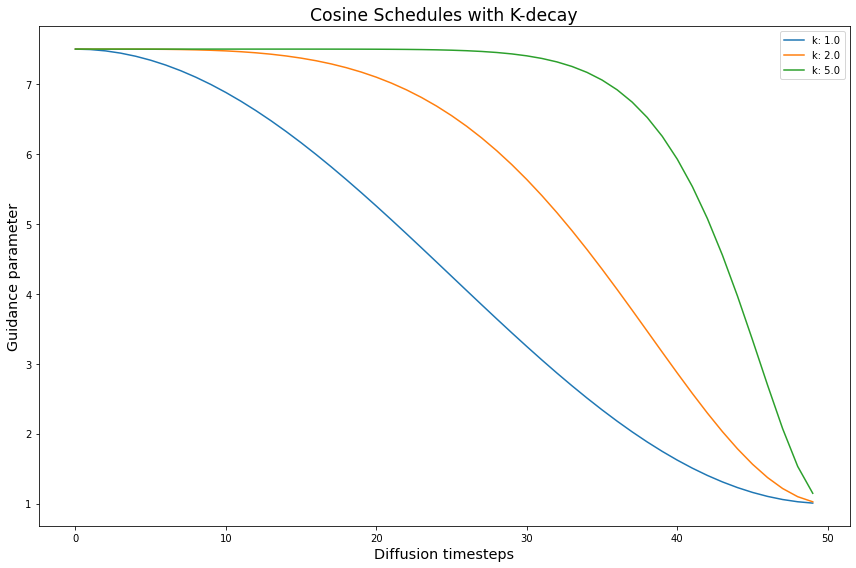

In [ ]:
#| echo: false
#| output: true
colors=list(mcolors.TABLEAU_COLORS)

# setup the plot
fig,ax = plt.subplots(figsize=(12,8))
plt.title('Cosine Schedules with K-decay', fontsize='xx-large')
plt.xlabel('Diffusion timesteps', fontsize='x-large')
plt.ylabel('Guidance parameter', fontsize='x-large')

# plot each k values
for idx,s in enumerate(k_expts):
    ax.plot(s['schedule'], c=colors[idx], label=f'k: {s["val"]:.1f}')
    
plt.legend()
plt.tight_layout();

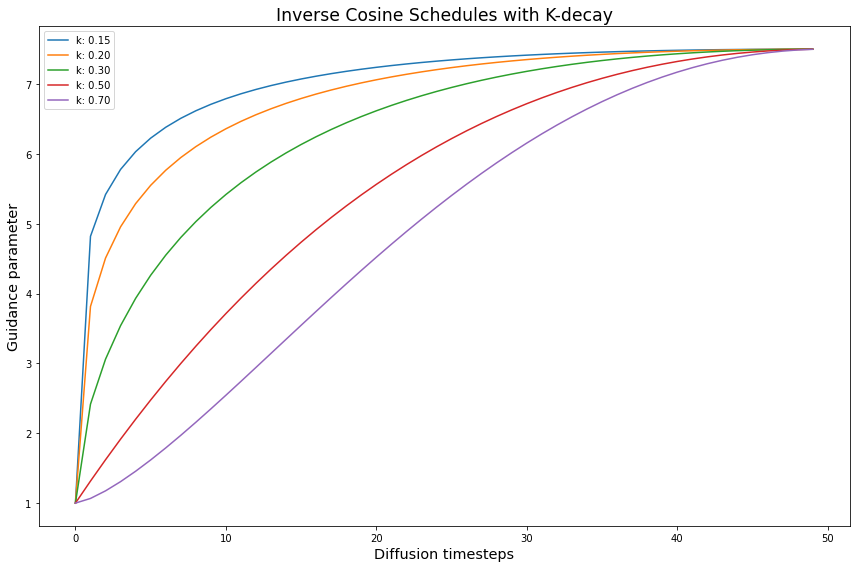

In [ ]:
#| echo: false
#| output: true
colors=list(mcolors.TABLEAU_COLORS)

# setup the plot
fig,ax = plt.subplots(figsize=(12,8))
plt.title('Inverse Cosine Schedules with K-decay', fontsize='xx-large')
plt.xlabel('Diffusion timesteps', fontsize='x-large')
plt.ylabel('Guidance parameter', fontsize='x-large')

# plot each k values
for idx,s in enumerate(inv_k_expts):
    ax.plot(s['schedule'], c=colors[idx], label=f'k: {s["val"]:.2f}')
    
plt.legend()
plt.tight_layout();

We repeat this for the `T` and `Full` Normalizations as well

In [ ]:
# create the k-decay cosine experiments
T_k_func = partial(cos_harness, default_params=DEFAULT_T_PARAMS)
T_k_expts = create_expts(k_params, T_k_func)

# create the Inverse-k-decay cosine experiments
T_inv_k_func = partial(cos_harness, default_params=DEFAULT_T_PARAMS)
T_inv_k_expts = create_expts(inv_k_params, T_inv_k_func)

# stores the inverted schedules
tmp = []
# flip the schedules
for s in T_inv_k_expts:
    new_vals = dict(s)
    inv = [max_T - g + min_T for g in s['schedule']]
    new_vals['schedule'] = inv
    tmp.append(new_vals)
T_inv_k_expts = tmp

all_T_k_expts = T_k_expts + T_inv_k_expts

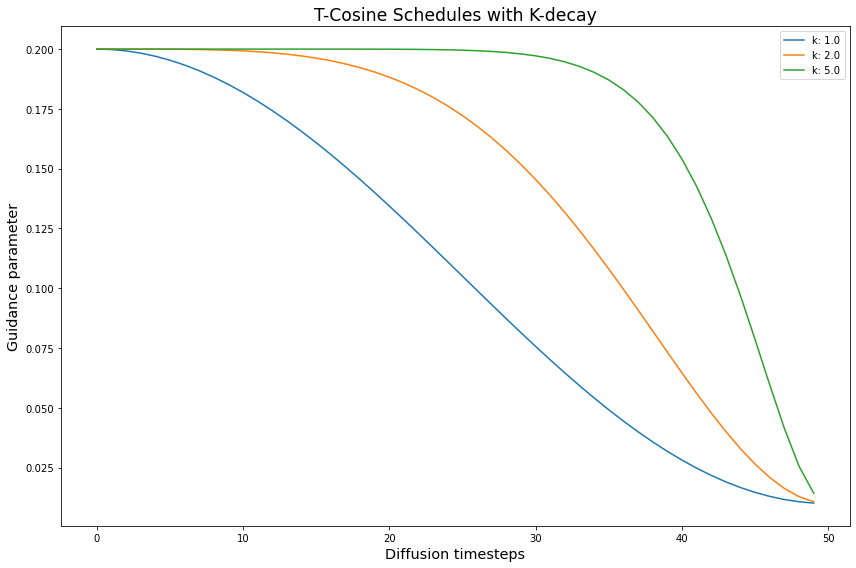

In [ ]:
#| echo: false
#| output: true
colors=list(mcolors.TABLEAU_COLORS)

# setup the plot
fig,ax = plt.subplots(figsize=(12,8))
plt.title('T-Cosine Schedules with K-decay', fontsize='xx-large')
plt.xlabel('Diffusion timesteps', fontsize='x-large')
plt.ylabel('Guidance parameter', fontsize='x-large')

# plot each k values
for idx,s in enumerate(T_k_expts):
    ax.plot(s['schedule'], c=colors[idx], label=f'k: {s["val"]:.1f}')
    
plt.legend()
plt.tight_layout();

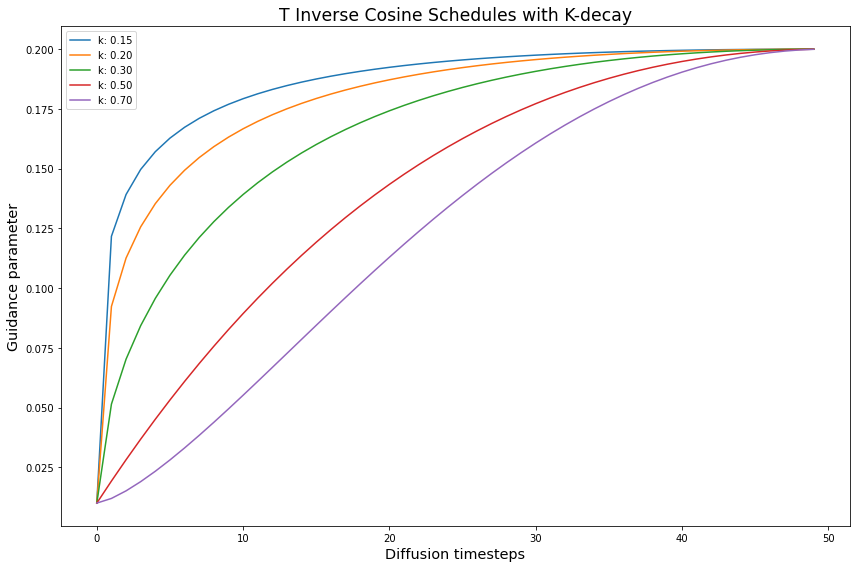

In [ ]:
#| echo: false
#| output: true
colors=list(mcolors.TABLEAU_COLORS)

# setup the plot
fig,ax = plt.subplots(figsize=(12,8))
plt.title('T Inverse Cosine Schedules with K-decay', fontsize='xx-large')
plt.xlabel('Diffusion timesteps', fontsize='x-large')
plt.ylabel('Guidance parameter', fontsize='x-large')

# plot each k values
for idx,s in enumerate(T_inv_k_expts):
    ax.plot(s['schedule'], c=colors[idx], label=f'k: {s["val"]:.2f}')
    
plt.legend()
plt.tight_layout();

# Loading the `Stable Diffusion v1-4` model from CompVis

The `min_diffusion` library loads a Stable Diffusion model from the HuggingFace hub.

In [ ]:
# to load Stable Diffusion pipelines
from min_diffusion.core import MinimalDiffusion

# to plot generated images
from min_diffusion.utils import show_image, image_grid, plot_grid

2022-11-25 13:55:51.399114: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


We use it to load the `Stable Diffusion v1-4` model on the GPU, with `torch.float16` precision.

In [ ]:
model_name = 'CompVis/stable-diffusion-v1-4'
device     = 'cuda'
dtype      = torch.float16

In [ ]:
pipeline = MinimalDiffusion(model_name, device, dtype, generator=generator)

In [ ]:
pipeline.load(better_vae='ema');

Using the improved VAE "ema" from stabiliy.ai
Enabling default unet attention slicing.


/home/paperspace/mambaforge/envs/prod/lib/python3.8/site-packages/diffusers/utils/deprecation_utils.py:35: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  warnings.warn(warning + message, FutureWarning)


# Text prompt for image generations

We use the familiar, running prompt in our series to generate an image:  

> "a photograph of an astronaut riding a horse"

In [ ]:
# text prompt for image generations
prompt = "a photograph of an astronaut riding a horse"

## Image parameters

Images will be generated over $50$ diffusion steps. They will have a height and width of `512 x 512` pixels. 

In [ ]:
# the number of diffusion steps
num_steps = 50

# generated image dimensions
width, height = 512, 512

# Running the experiments

The `run` function below generates images for a given `prompt`.  

It also stores the output images with a matching title for plotting and visualizations.

In [ ]:
def run(prompt, schedules, guide_tfm=None, generator=None,
        show_each=False, test_run=False):
    """Runs a dynamic Classifier-free Guidance experiment. 
    
    Generates an image for the text `prompt` given all the values in `schedules`.
    Uses a Guidance Transformation class from the `cf_guidance` library.  
    Stores the output images with a matching title for plotting. 
    Optionally shows each image as its generated.
    If `test_run` is true, it runs a single schedule for testing. 
    """
    # store generated images and their title (the experiment name)
    images, titles = [], []
    
    # make sure we have a valid guidance transform
    assert guide_tfm
    print(f'Using Guidance Transform: {guide_tfm}')
    
    # optionally run a single test schedule
    if test_run:
        print(f'Running a single schedule for testing.')
        schedules = schedules[:1]
        
    # run all schedule experiments
    for i,s in enumerate(schedules):
        
        # parse out the title for the current run
        cur_title  = s['title']
        titles.append(cur_title)
        
        # create the guidance transformation 
        cur_sched = s['schedule']
        gtfm = guide_tfm({'g': cur_sched})
        
        print(f'Running experiment [{i+1} of {len(schedules)}]: {cur_title}...')
        img = pipeline.generate(prompt, gtfm, generator=generator)
        images.append(img)
        
        # optionally plot the image
        if show_each:
            show_image(img, scale=1)

    print('Done.')
    return {'images': images,
            'titles': titles}

## Creating the baseline image with $G = 7.5$

First we create the baseline image using a constant Classifier-free Guidance with $G = 7.5$. Since this is a constant schedule, $k$ does not come into play.  

In [ ]:
# create the baseline schedule with the new function
baseline_g = 7.5
baseline_params = {'max_val': [baseline_g]}
baseline_func = lambda *args, **kwargs: [baseline_g for _ in range(num_steps)]
baseline_expts = create_expts(baseline_params, baseline_func)

In [ ]:
baseline_res = run(prompt, baseline_expts, guide_tfm=GuidanceTfm)

Using Guidance Transform: <class 'cf_guidance.transforms.GuidanceTfm'>
Running experiment [1 of 1]: Param: "max_val", val=7.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


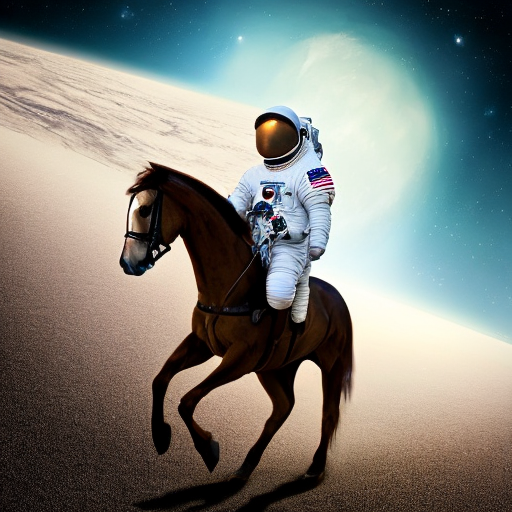

In [ ]:
# view the baseline image
baseline_res['images'][0]

## Improving the baseline with schedules and normalizations 

Now let's run our `kDecay` schedules with normalizations. Then we can check how it changed the baseline image.  

Since every run starts from the exact same noisy latents, only the schedules and normalizations are affecting the output.

## `Prediction Normalization` runs

In [ ]:
print('Running the Prediction Norm experiments...')
base_norm_res = run(prompt, all_k_expts, guide_tfm=BaseNormGuidance)

Running the Prediction Norm experiments...
Using Guidance Transform: <class 'cf_guidance.transforms.BaseNormGuidance'>
Running experiment [1 of 8]: Param: "k_decay", val=1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [2 of 8]: Param: "k_decay", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [3 of 8]: Param: "k_decay", val=5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [4 of 8]: Param: "k_decay", val=0.15...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [5 of 8]: Param: "k_decay", val=0.2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [6 of 8]: Param: "k_decay", val=0.3...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [7 of 8]: Param: "k_decay", val=0.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [8 of 8]: Param: "k_decay", val=0.7...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


## `T-Normalization` runs

In [ ]:
print('Running the T-Norm experiments...')
T_norm_res = run(prompt, all_T_k_expts, guide_tfm=TNormGuidance)

Running the T-Norm experiments...
Using Guidance Transform: <class 'cf_guidance.transforms.TNormGuidance'>
Running experiment [1 of 8]: Param: "k_decay", val=1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [2 of 8]: Param: "k_decay", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [3 of 8]: Param: "k_decay", val=5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [4 of 8]: Param: "k_decay", val=0.15...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [5 of 8]: Param: "k_decay", val=0.2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [6 of 8]: Param: "k_decay", val=0.3...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [7 of 8]: Param: "k_decay", val=0.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [8 of 8]: Param: "k_decay", val=0.7...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


## `Full Normalization` runs

In [ ]:
print('Running the T-Norm experiments...')
full_norm_res = run(prompt, all_T_k_expts, guide_tfm=FullNormGuidance)

Running the T-Norm experiments...
Using Guidance Transform: <class 'cf_guidance.transforms.FullNormGuidance'>
Running experiment [1 of 8]: Param: "k_decay", val=1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [2 of 8]: Param: "k_decay", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [3 of 8]: Param: "k_decay", val=5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [4 of 8]: Param: "k_decay", val=0.15...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [5 of 8]: Param: "k_decay", val=0.2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [6 of 8]: Param: "k_decay", val=0.3...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [7 of 8]: Param: "k_decay", val=0.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [8 of 8]: Param: "k_decay", val=0.7...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


# Results

## `Prediction Normalization` results

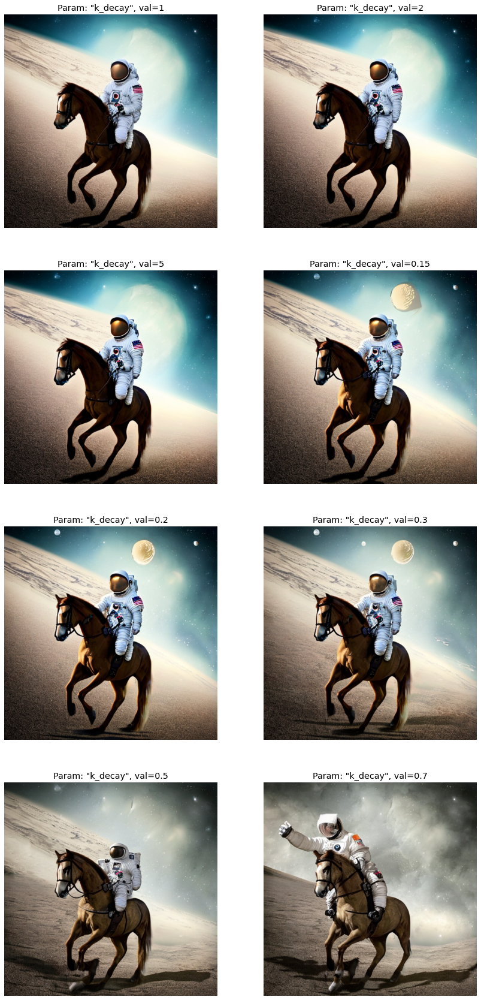

In [ ]:
#| echo: false
#| output: true
# display all images
image_grid(base_norm_res['images'], title=base_norm_res['titles'], rows=4, width=width, height=height)

## `T-Normalization` results

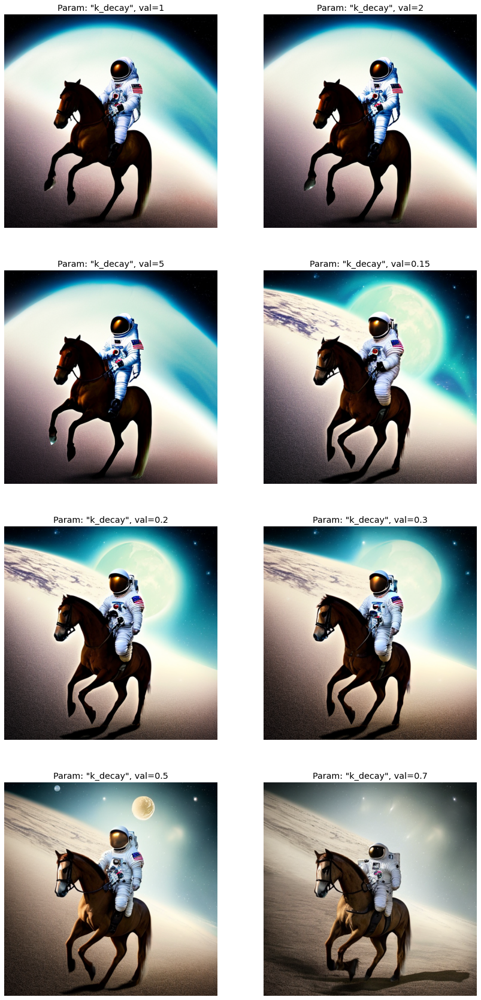

In [ ]:
#| echo: false
#| output: true
# display all images
image_grid(T_norm_res['images'], title=T_norm_res['titles'], rows=4, width=width, height=height)

## `Full-Normalization` results

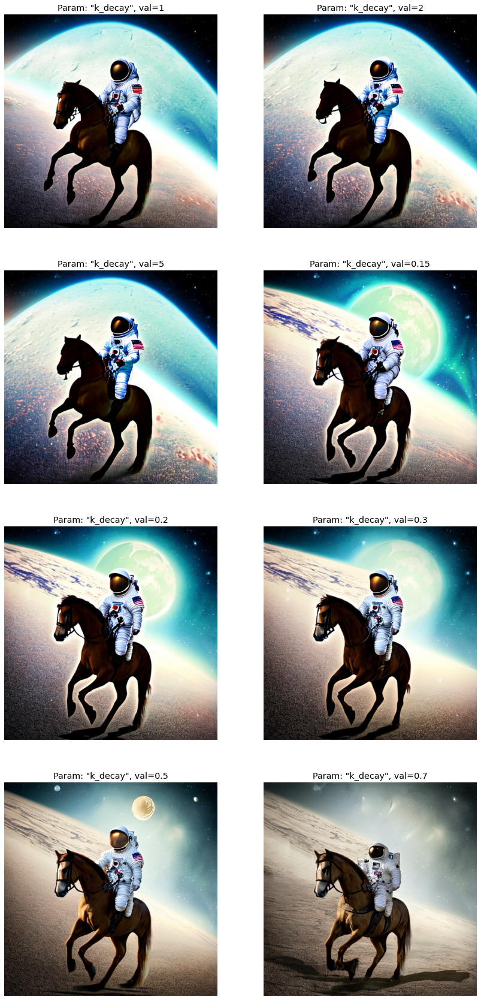

In [ ]:
#| echo: false
#| output: true
# display all images
image_grid(full_norm_res['images'], title=full_norm_res['titles'], rows=4, width=width, height=height)

# Analysis

`Inverse kDecay` schedules improve the images the most. The regular `kDecay` schedules also helped, but the improvements are not as drastic.  

The sweet spot for `Inverse kDecay` seems to be between $0.15$ and $0.3$. It is not fully constant throughout the normalizations either. Sometimes $0.15$ is better than $0.2$ and vice-versa.  

When in doubt, it seems $0.2$ is a good middle ground. Perhaps we need to explore this range further, or increase the slope of the initial `kDecay` warmup.  

## `Prediction Normalization` comparison

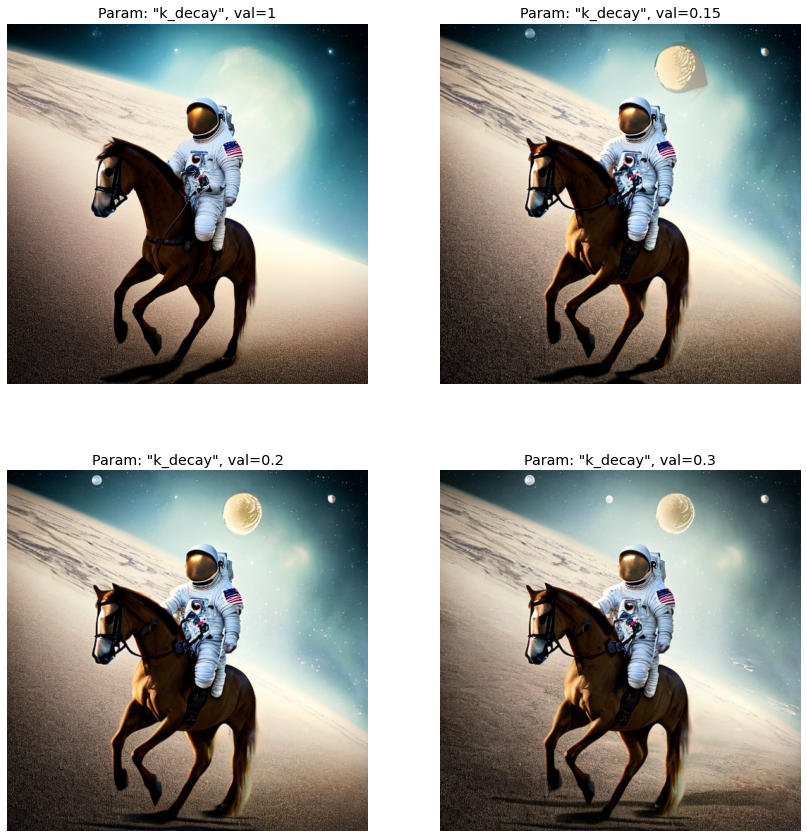

In [ ]:
#| echo: false
#| output: true
image_grid(
    [baseline_res['images'][0], base_norm_res['images'][3],
    base_norm_res['images'][4], base_norm_res['images'][5]], 

    title=[full_norm_res['titles'][0], base_norm_res['titles'][3],
    base_norm_res['titles'][4], base_norm_res['titles'][5]],

    rows=2, width=width, height=height
 )

## `T-Normalization` comparison

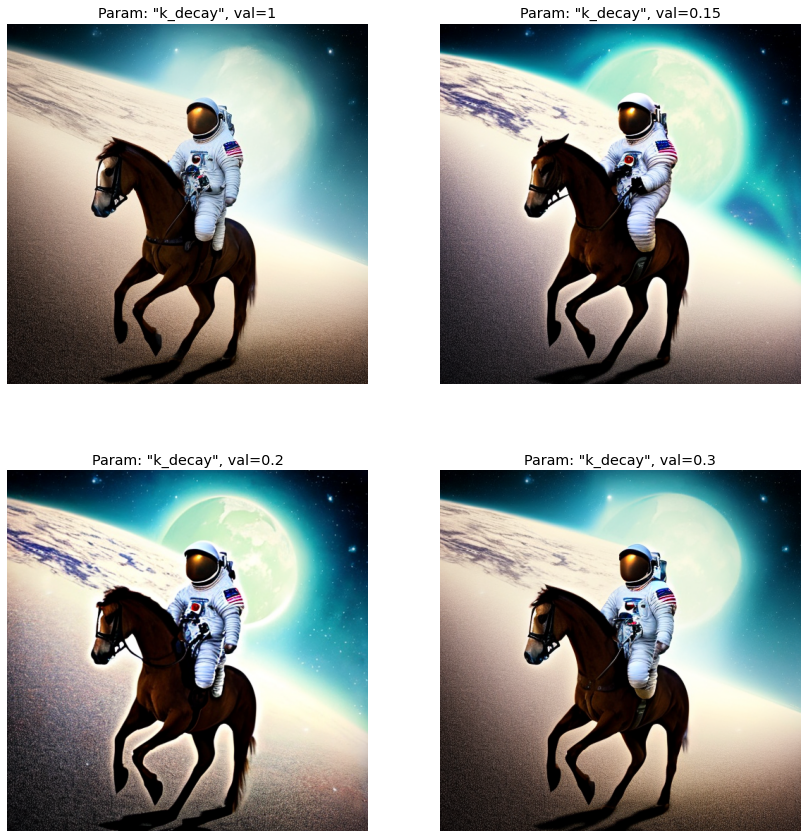

In [ ]:
#| echo: false
#| output: true
image_grid(  
    [baseline_res['images'][0], T_norm_res['images'][3],
    full_norm_res['images'][4], T_norm_res['images'][5]], 

    title=[full_norm_res['titles'][0], T_norm_res['titles'][3],
    T_norm_res['titles'][4], T_norm_res['titles'][5]],

    rows=2, width=width, height=height
)

## `Full Normalization` comparison

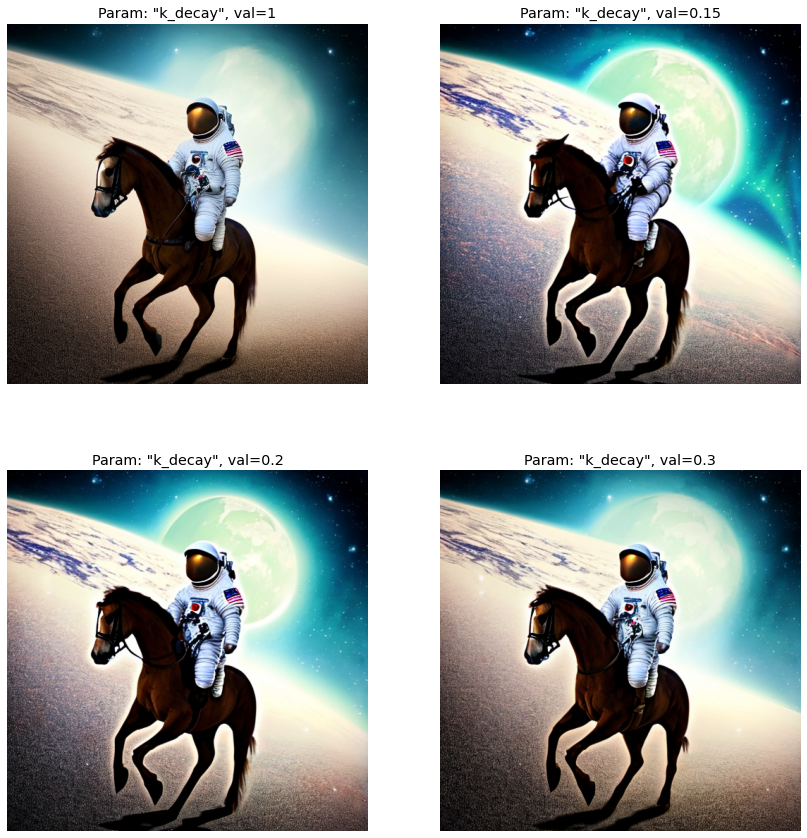

In [ ]:
#| echo: false
#| output: true
image_grid(
    [baseline_res['images'][0], full_norm_res['images'][3],
     full_norm_res['images'][4], full_norm_res['images'][5]], 

    title=[full_norm_res['titles'][0], full_norm_res['titles'][3],
     full_norm_res['titles'][4], full_norm_res['titles'][5]],
    
    rows=2, width=width, height=height)

## Comparing $k = 0.15$ across normalizations

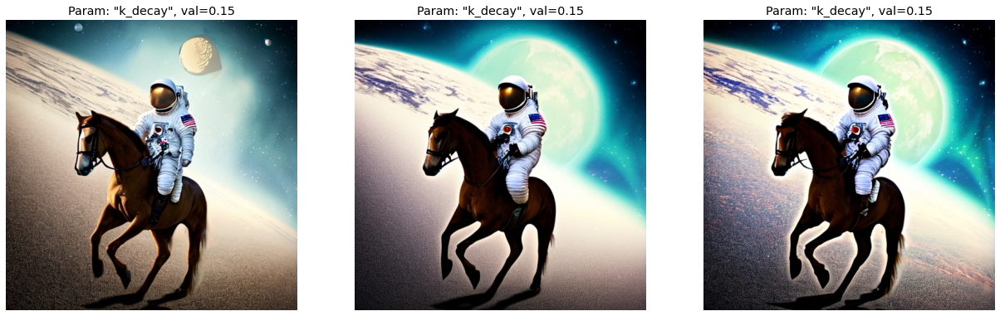

In [ ]:
#| echo: false
#| output: true
image_grid(
    [base_norm_res['images'][3],
     T_norm_res['images'][3], full_norm_res['images'][3]], 

    title=[base_norm_res['titles'][3],
     T_norm_res['titles'][3], full_norm_res['titles'][3]],
    
    rows=1, width=width, height=height)

## Comparing $k = 0.2$ across normalizations

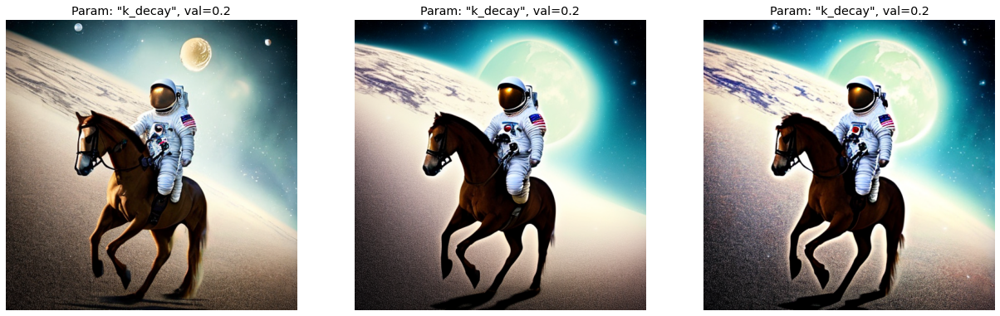

In [ ]:
#| echo: false
#| output: true
image_grid(
    [base_norm_res['images'][4],
     T_norm_res['images'][4], full_norm_res['images'][4]], 

    title=[base_norm_res['titles'][4],
     T_norm_res['titles'][4], full_norm_res['titles'][4]],
    
    rows=1, width=width, height=height)

## Comparing $k = 0.3$ across normalizations

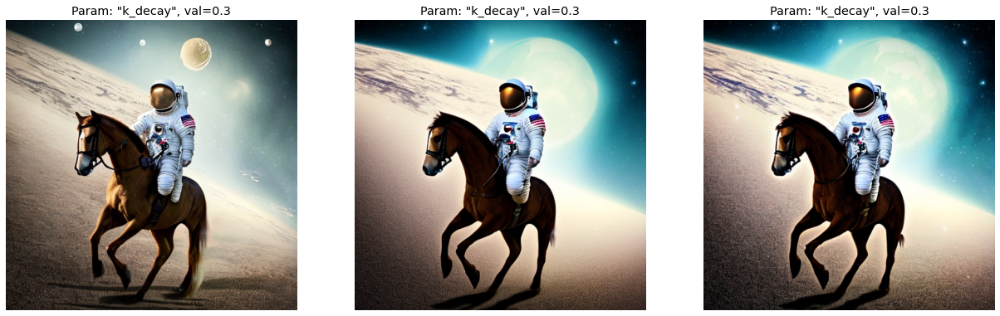

In [ ]:
#| echo: false
#| output: true
image_grid(
    [base_norm_res['images'][5],
     T_norm_res['images'][5], full_norm_res['images'][5]], 

    title=[base_norm_res['titles'][5],
     T_norm_res['titles'][5], full_norm_res['titles'][5]],
    
    rows=1, width=width, height=height)

At this point, the difference in quality between $0.15$ and $0.2$ becomes subjective. It does seem that 0.2 makes for more stable images across the normalizations. But, 0.15 fixed the astronaut's leg and arm.  

$0.3$ still improves the image, but we start to lose texture and coherence in the background. 

# Conclusion

In Part 6 of the series we combined our best schedules so far with normalizations.  

We found that normalizations with an `Inverse kDecay` schedule of $k = 0.2$ or $k = 0.15$ improved on the baseline. These schedules gave the background more details, enhanced details on the floor, improved details in the astronaut's suit, and made the horse more anatomically correct. This confirms our explorations in previous notebooks, which showed that the Guidance scaling had to warmup quickly and/or stay high for as long as possible.    

In Part 7, we will check if these gains hold across different Stable Diffusion models.